<a href="https://colab.research.google.com/github/karanp8251/MlWorkshop/blob/main/Copy_of_yoloUnet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Advanced Computer Vision Models: YOLO, U-Net, and 3D CNN

This notebook demonstrates basic implementations and usage examples of three popular advanced computer vision models:

1.  **YOLO (You Only Look Once)**: A state-of-the-art real-time object detection system.
2.  **U-Net**: A convolutional network architecture for fast and precise image segmentation.
3.  **3D CNN (Three-Dimensional Convolutional Neural Network)**: Used for processing volumetric data or video sequences.

## Setup and Installations

In [1]:
# Install necessary libraries
!pip install ultralytics tensorflow matplotlib numpy -q

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2 # For image processing in YOLO example
from google.colab.patches import cv2_imshow # For displaying images in Colab

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 14.4 MB/s eta 0:00:00


## 1. YOLO (You Only Look Once) for Object Detection

YOLO is a family of object detection models that are known for their speed and accuracy. Here, we'll use the `ultralytics` library to demonstrate YOLOv8 inference and visualization.

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
--2026-04-22 04:52:37--  https://ultralytics.com/images/bus.jpg
Resolving ultralytics.com (ultralytics.com)... 198.202.211.1
Connecting to ultralytics.com (ultralytics.com)|198.202.211.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.ultralytics.com/images/bus.jpg [following]
--2026-04-22 04:52:38--  https://www.ultralytics.com/images/bus.jpg
Resolving www.ultralytics.com (www.ultralytics.com)... 198.202.211.1, 2620:cb:2000::1
Connecting to www.ultralytics.com (www.ultralytics.com)|198.202.211.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/ultralytics/assets/rel

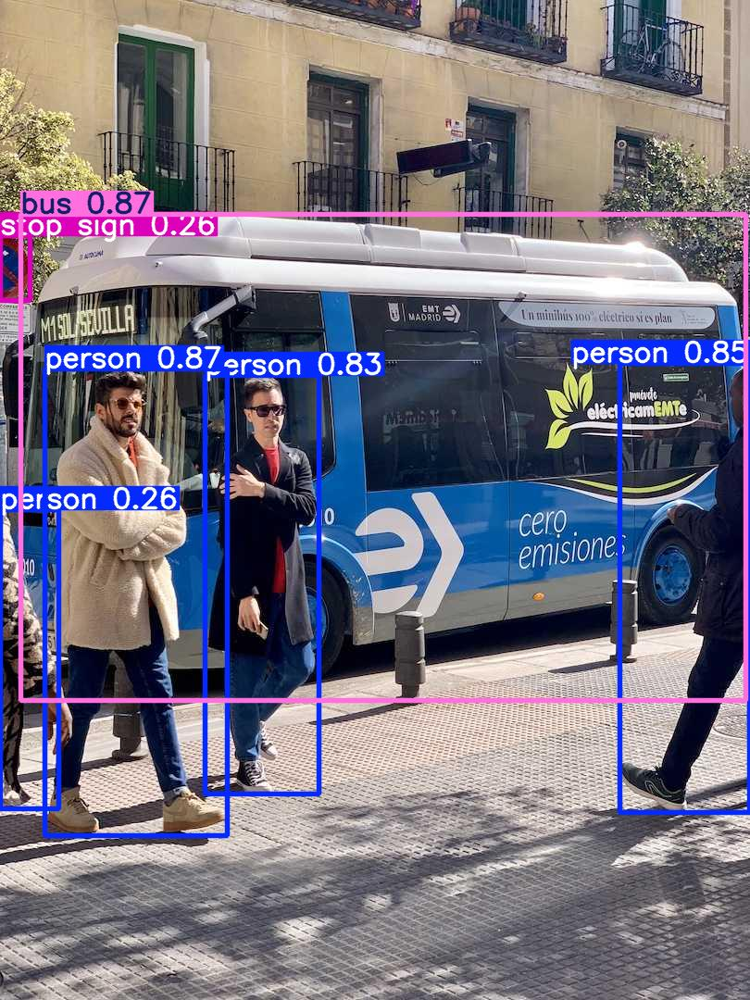

In [2]:
from ultralytics import YOLO
from PIL import Image # Import Image from PIL

# Load a pre-trained YOLOv8 model
model = YOLO('yolov8n.pt')  # yolov8n is the nano version, good for quick demos

# Download a sample image for demonstration
!wget -O bus.jpg https://ultralytics.com/images/bus.jpg

# Perform inference on the image
results = model('bus.jpg', conf=0.25)  # conf=0.25 sets object confidence threshold

# Visualize the results
for r in results:
    im_array = r.plot()  # plot a BGR numpy array of predictions
    im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
    im.save('results.jpg')  # save image

print("YOLOv8 inference complete. Displaying results:")
cv2_imshow(cv2.imread('results.jpg'))

## 2. U-Net for Image Segmentation

U-Net is a popular convolutional neural network architecture for fast and precise semantic segmentation of images. It's often used in biomedical image segmentation. Here's a basic TensorFlow Keras implementation.

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    147,584 │ conv2d_2[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    590,080 │ conv2d_4[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 128, 128,  │          0 │ conv2d_5[0][0]    │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 128, 128,  │    131,200 │ up_sampling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 128, 128,  │          0 │ conv2d_3[0][0],   │
│ (Concatenate)       │ 256)              │            │ conv2d_6[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 128, 128,  │    295,040 │ concatenate[0][0] │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 128, 128,  │    147,584 │ conv2d_7[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_1     │ (None, 256, 256,  │          0 │ conv2d_8[0][0]    │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 256, 256,  │     32,832 │ up_sampling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 256, 256,  │          0 │ conv2d_1[0][0], 

 Total params: 1,862,849 (7.11 MB)

 Trainable params: 1,862,849 (7.11 MB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step

Dummy input shape: (1, 256, 256, 3)
Dummy output mask shape: (1, 256, 256, 1)


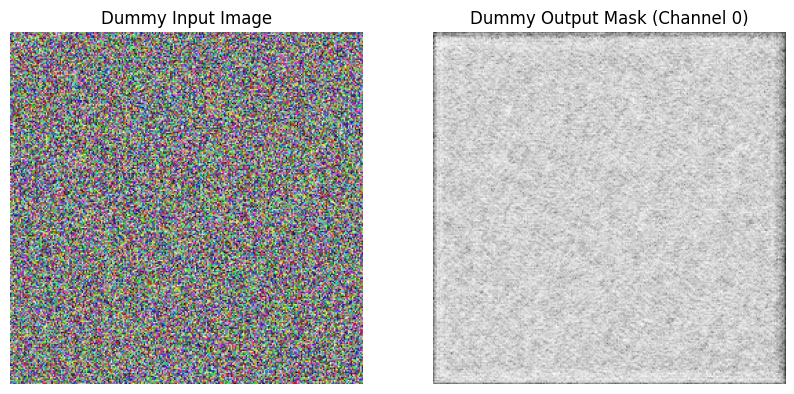

In [3]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model

def unet_model(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    # Encoder path
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    # Bottleneck
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)

    # Decoder path
    up4 = Conv2D(128, 2, activation='relu', padding='same', kernel_initializer='he_normal')(UpSampling2D(size=(2, 2))(conv3))
    merge4 = concatenate([conv2, up4], axis=3)
    conv4 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge4)
    conv4 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)

    up5 = Conv2D(64, 2, activation='relu', padding='same', kernel_initializer='he_normal')(UpSampling2D(size=(2, 2))(conv4))
    merge5 = concatenate([conv1, up5], axis=3)
    conv5 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge5)
    conv5 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)

    conv6 = Conv2D(1, 1, activation='sigmoid')(conv5) # Output a single channel for binary segmentation

    model = Model(inputs=inputs, outputs=conv6)

    return model

# Create and summarize the U-Net model
unet = unet_model()
unet.summary()

# Demonstrate with a dummy input
dummy_input_image = np.random.rand(1, 256, 256, 3).astype(np.float32)
dummy_output_mask = unet.predict(dummy_input_image)

print(f"\nDummy input shape: {dummy_input_image.shape}")
print(f"Dummy output mask shape: {dummy_output_mask.shape}")

# Visualize a dummy input and output (first channel of the mask)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Dummy Input Image")
plt.imshow(dummy_input_image[0])
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Dummy Output Mask (Channel 0)")
plt.imshow(dummy_output_mask[0, :, :, 0], cmap='gray')
plt.axis('off')
plt.show()

## 3. 3D CNN for Volumetric Data Processing

3D Convolutional Neural Networks are extensions of 2D CNNs designed to process volumetric data (like medical scans) or video data by applying filters in three dimensions. Here's a simple 3D CNN architecture using TensorFlow Keras.

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 32, 32, 32, 1)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d (Conv3D)                 │ (None, 32, 32, 32, 32) │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d (MaxPooling3D)    │ (None, 16, 16, 16, 32) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_1 (Conv3D)               │ (None, 16, 16, 16, 64) │        55,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_1 (MaxPooling3D)  │ (None, 8, 8, 8, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     4,194,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,250,946 (16.22 MB)

 Trainable params: 4,250,946 (16.22 MB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step

Dummy 3D input shape: (1, 32, 32, 32, 1)
Dummy 3D output (probabilities for 2 classes): (1, 2)
Example prediction: [    0.64723     0.35277]


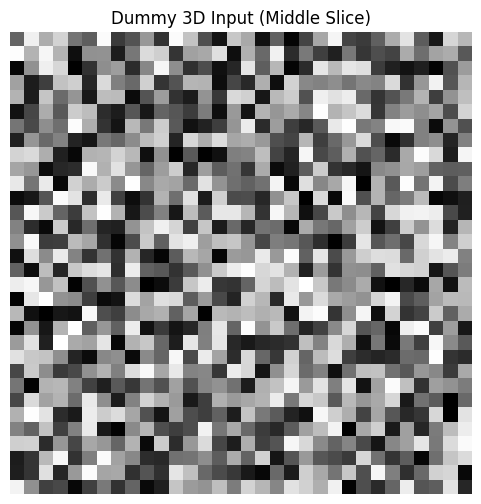

In [4]:
from tensorflow.keras.layers import Input, Conv3D, MaxPooling3D, Flatten, Dense
from tensorflow.keras.models import Model

def cnn3d_model(input_shape=(32, 32, 32, 1), num_classes=2):
    inputs = Input(input_shape)

    conv1 = Conv3D(32, kernel_size=(3, 3, 3), activation='relu', padding='same')(inputs)
    pool1 = MaxPooling3D(pool_size=(2, 2, 2))(conv1)

    conv2 = Conv3D(64, kernel_size=(3, 3, 3), activation='relu', padding='same')(pool1)
    pool2 = MaxPooling3D(pool_size=(2, 2, 2))(conv2)

    flatten = Flatten()(pool2)
    dense1 = Dense(128, activation='relu')(flatten)
    outputs = Dense(num_classes, activation='softmax')(dense1) # Example for classification

    model = Model(inputs=inputs, outputs=outputs)
    return model

# Create and summarize the 3D CNN model
cnn3d = cnn3d_model()
cnn3d.summary()

# Demonstrate with a dummy 3D input (e.g., a small 3D medical scan)
dummy_3d_input = np.random.rand(1, 32, 32, 32, 1).astype(np.float32)
dummy_3d_output = cnn3d.predict(dummy_3d_input)

print(f"\nDummy 3D input shape: {dummy_3d_input.shape}")
print(f"Dummy 3D output (probabilities for {cnn3d.output_shape[1]} classes): {dummy_3d_output.shape}")
print(f"Example prediction: {dummy_3d_output[0]}")

# To visualize 3D data, you would typically use libraries like `nibabel` or `ITK`
# Here, we'll just show a slice as a basic visualization.
plt.figure(figsize=(6, 6))
plt.title("Dummy 3D Input (Middle Slice)")
plt.imshow(dummy_3d_input[0, :, :, 16, 0], cmap='gray') # Showing the 16th slice along the depth dimension
plt.axis('off')
plt.show()

## Exercises for Students

Here are some exercises to help you understand and experiment with the advanced computer vision models demonstrated in this notebook.

### YOLO Object Detection Exercises

1.  **Adjust Confidence Threshold:** Modify the `conf` parameter in the YOLO inference cell (`ba2f1103`) to `0.5` or `0.1`. Observe how the number of detected objects changes. What does the confidence threshold represent?

    ```python
    # Example: Adjusting confidence threshold
    # results = model('bus.jpg', conf=0.5)
    ```

2.  **Try a Different Image:** Find another image online (e.g., of people, animals, or vehicles) and replace `bus.jpg` with your new image. Rerun the YOLO inference to see its performance on a different scene.

    ```python
    # Example: Using a different image
    # !wget -O new_image.jpg <URL_OF_YOUR_IMAGE>
    # results = model('new_image.jpg', conf=0.25)
    ```

3.  **Load a Larger Model:** The current example uses `yolov8n.pt` (nano version). Try loading `yolov8m.pt` (medium version) instead. Be aware that this might take longer to download and run, but it could offer better detection accuracy. Compare the results with the nano version.

    ```python
    # Example: Loading a larger model
    # model = YOLO('yolov8m.pt')
    ```

#### Solution to YOLO Exercise 1: Adjust Confidence Threshold


--- YOLO Inference with Confidence Threshold 0.5 ---

image 1/1 /content/bus.jpg: 640x480 3 persons, 1 bus, 241.1ms
Speed: 4.3ms preprocess, 241.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)


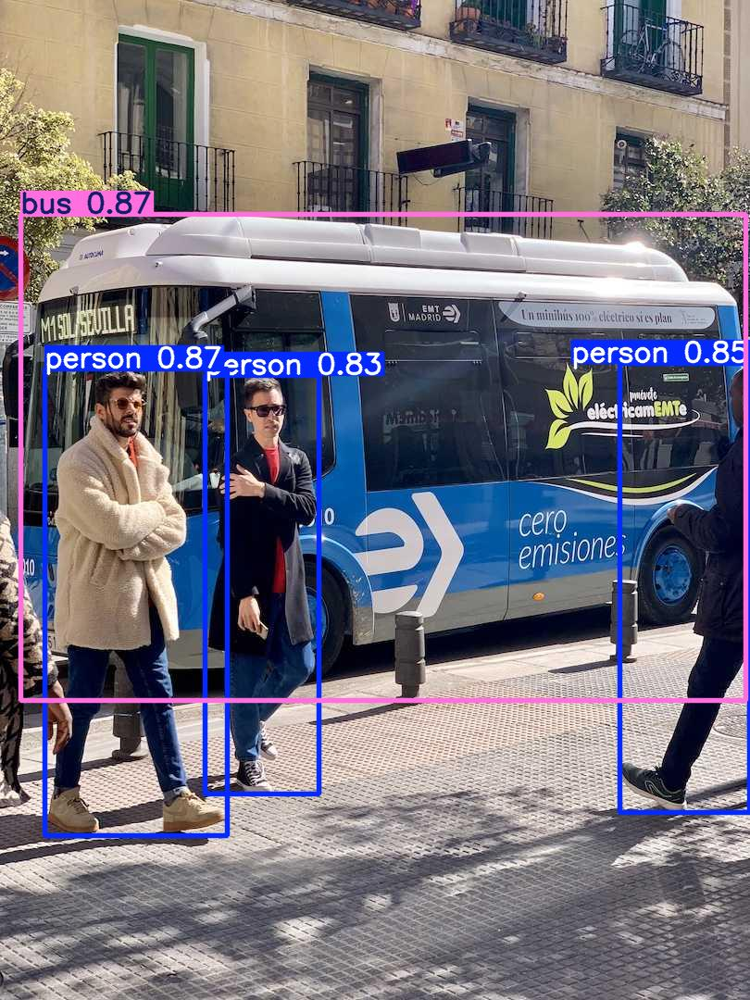


--- YOLO Inference with Confidence Threshold 0.1 ---

image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 227.3ms
Speed: 3.9ms preprocess, 227.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


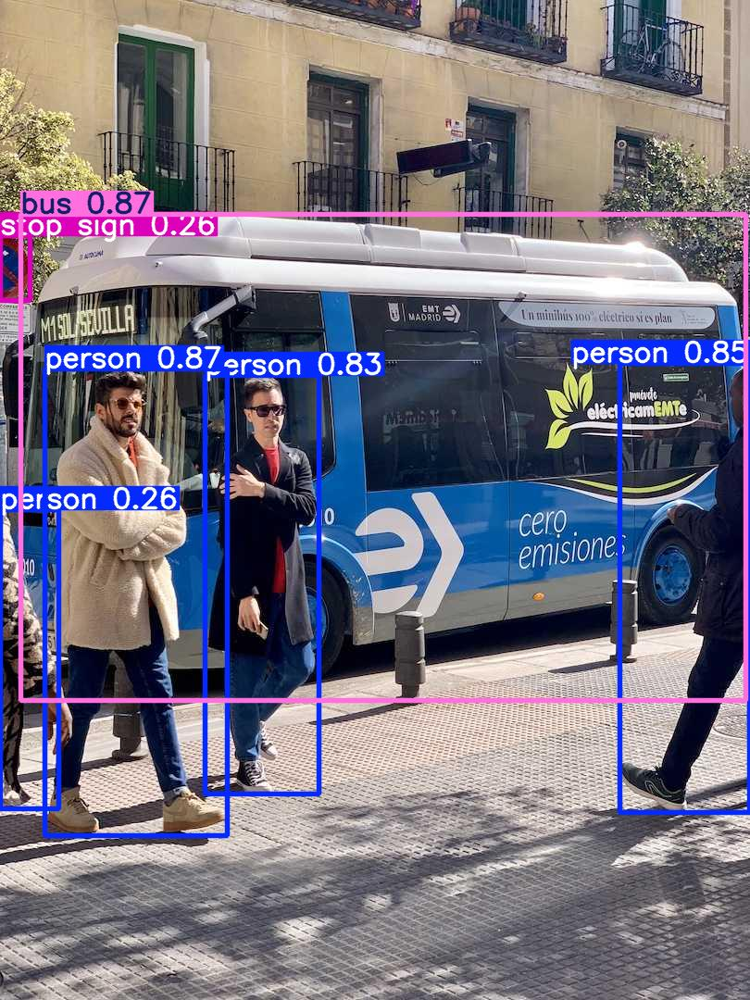

In [5]:
from ultralytics import YOLO
from PIL import Image

model = YOLO('yolov8n.pt')

# Adjusting confidence threshold to 0.5
print("\n--- YOLO Inference with Confidence Threshold 0.5 ---")
results_high_conf = model('bus.jpg', conf=0.5)
for r in results_high_conf:
    im_array_high = r.plot()
    im_high = Image.fromarray(im_array_high[..., ::-1])
    im_high.save('results_conf05.jpg')
cv2_imshow(cv2.imread('results_conf05.jpg'))

# Adjusting confidence threshold to 0.1
print("\n--- YOLO Inference with Confidence Threshold 0.1 ---")
results_low_conf = model('bus.jpg', conf=0.1)
for r in results_low_conf:
    im_array_low = r.plot()
    im_low = Image.fromarray(im_array_low[..., ::-1])
    im_low.save('results_conf01.jpg')
cv2_imshow(cv2.imread('results_conf01.jpg'))

#### Solution to YOLO Exercise 2: Try a Different Image


--- YOLO Inference on a Different Image ---
--2026-04-22 04:52:44--  https://cdn.pixabay.com/photo/2016/12/13/05/15/puppy-1903313_1280.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 172.64.147.160, 104.18.40.96, 2a06:98c1:3107::6812:2860, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|172.64.147.160|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 190800 (186K) [image/jpeg]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>] 186.33K  --.-KB/s    in 0.03s   

2026-04-22 04:52:44 (6.87 MB/s) - ‘dog.jpg’ saved [190800/190800]


image 1/1 /content/dog.jpg: 448x640 1 dog, 294.4ms
Speed: 5.9ms preprocess, 294.4ms inference, 5.8ms postprocess per image at shape (1, 3, 448, 640)


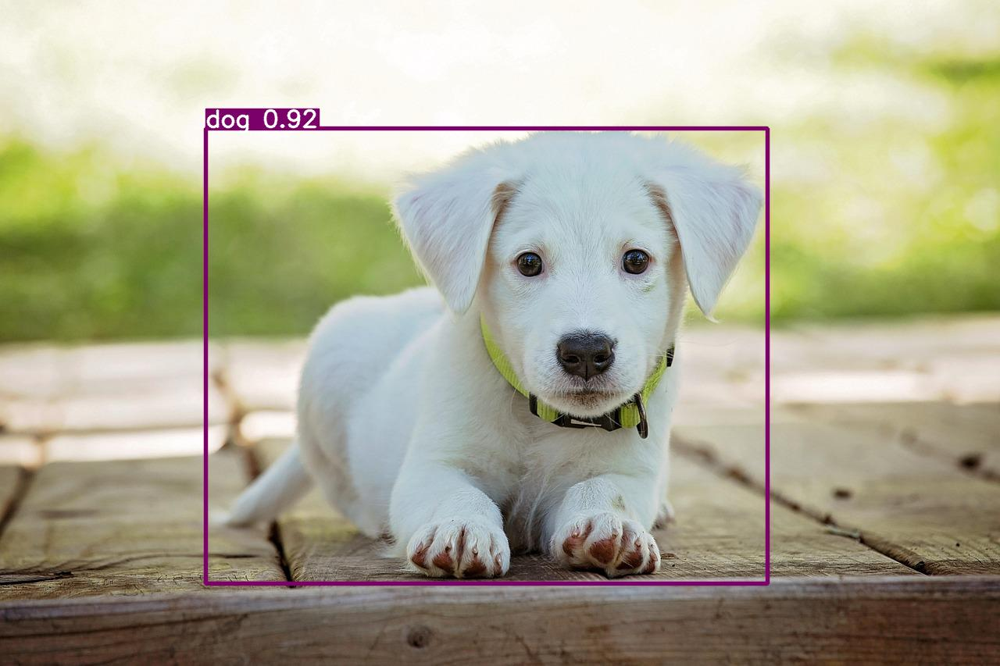

In [6]:
from ultralytics import YOLO
from PIL import Image

model = YOLO('yolov8n.pt')

# Example: Downloading a different image (e.g., a dog image)
# You can replace this URL with any other image URL
print("\n--- YOLO Inference on a Different Image ---")
# Trying a new, more direct link to a dog image
!wget -O dog.jpg https://cdn.pixabay.com/photo/2016/12/13/05/15/puppy-1903313_1280.jpg

results_dog = model('dog.jpg', conf=0.25)
for r in results_dog:
    im_array_dog = r.plot()
    im_dog = Image.fromarray(im_array_dog[..., ::-1])
    im_dog.save('results_dog.jpg')
cv2_imshow(cv2.imread('results_dog.jpg'))

#### Solution to YOLO Exercise 3: Load a Larger Model


--- Loading and using YOLOv8m (medium) model ---

image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 2094.6ms
Speed: 7.1ms preprocess, 2094.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)
YOLOv8m inference complete. Displaying results:


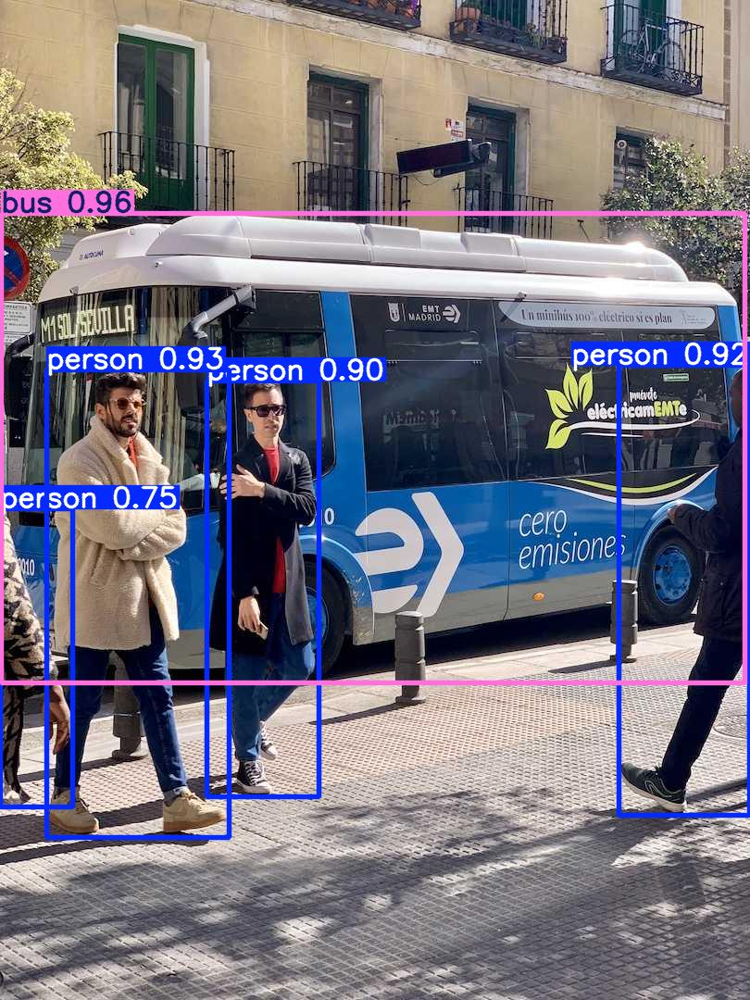

In [7]:
from ultralytics import YOLO
from PIL import Image

print("\n--- Loading and using YOLOv8m (medium) model ---")
model_m = YOLO('yolov8m.pt')  # Load the medium version

results_m = model_m('bus.jpg', conf=0.25)
for r in results_m:
    im_array_m = r.plot()
    im_m = Image.fromarray(im_array_m[..., ::-1])
    im_m.save('results_yolov8m.jpg')

print("YOLOv8m inference complete. Displaying results:")
cv2_imshow(cv2.imread('results_yolov8m.jpg'))

### U-Net Image Segmentation Exercises

1.  **Modify U-Net Architecture:** Experiment with the `unet_model` function in cell (`09edba5b`):
    *   Change the number of filters in one or more `Conv2D` layers (e.g., from 64 to 32 or 128).

        ```python
        # Example: Changing filters in unet_model
        # conv1 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
        ```

    *   Add an additional encoder/decoder block to make the network deeper (remember to adjust the `UpSampling2D` and `concatenate` layers accordingly).

    *   What impact do these changes have on the model summary and the dummy output mask shape?

2.  **Experiment with Activation Functions:** Change the activation function from `'relu'` to `'elu'` or `'leaky_relu'` in some of the `Conv2D` layers. How might this affect the model's learning capabilities?

    ```python
    # Example: Changing activation function
    # conv1 = Conv2D(64, 3, activation='elu', padding='same', kernel_initializer='he_normal')(inputs)
    ```

3.  **Challenge: Multi-class Segmentation:** If you were to adapt this U-Net for multi-class segmentation (e.g., segmenting different organs in a medical image), what changes would you make to the final `Conv2D` layer's filters and activation function?

    ```python
    # Example: Multi-class segmentation output layer for 5 classes
    # conv6 = Conv2D(5, 1, activation='softmax')(conv5)
    ```

#### Solution to U-Net Exercise 1: Modify U-Net Architecture

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_13 (Conv2D)  │ (None, 256, 256,  │        896 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_14 (Conv2D)  │ (None, 256, 256,  │      9,248 │ conv2d_13[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 128, 128,  │          0 │ conv2d_14[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 128, 128,  │     18,496 │ max_pooling2d_2[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 128, 128,  │     36,928 │ conv2d_15[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 64, 64,    │          0 │ conv2d_16[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_17 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_3[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 64, 64,    │    147,584 │ conv2d_17[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 32, 32,    │          0 │ conv2d_18[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 32, 32,    │    295,168 │ max_pooling2d_4[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 32, 32,    │    590,080 │ conv2d_19[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_2     │ (None, 64, 64,    │          0 │ conv2d_20[0][0]   │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 64, 64,    │    131,200 │ up_sampling2d_2[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 64, 64,    │          0 │ conv2d_18[0][0],  │
│ (Concatenate)       │ 256)              │            │ conv2d_21[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 64, 64,    │    295,040 │ concatenate_2[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 64, 64,    │    147,584 │ conv2d_22[0][0] 

 Total params: 1,925,601 (7.35 MB)

 Trainable params: 1,925,601 (7.35 MB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step

Dummy input shape: (1, 256, 256, 3)
Dummy output mask shape: (1, 256, 256, 1)


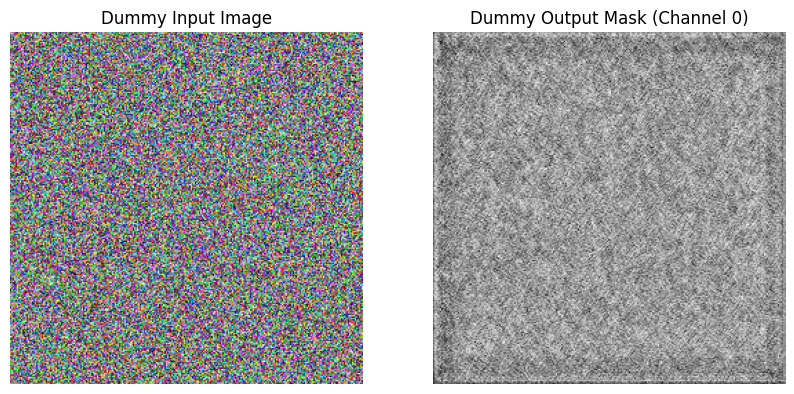

In [8]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model
import numpy as np
import matplotlib.pyplot as plt

def unet_model_modified(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    # Encoder path
    conv1 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs) # Changed filters to 32
    conv1 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
    conv2 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    # Added an additional encoder block
    conv_extra_enc = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
    conv_extra_enc = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv_extra_enc)
    pool_extra = MaxPooling2D(pool_size=(2, 2))(conv_extra_enc)

    # Bottleneck
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool_extra) # Connected to new pool
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)

    # Decoder path - correspondingly added an extra decoder block
    up_extra = Conv2D(128, 2, activation='relu', padding='same', kernel_initializer='he_normal')(UpSampling2D(size=(2, 2))(conv3))
    merge_extra = concatenate([conv_extra_enc, up_extra], axis=3)
    conv_extra_dec = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge_extra)
    conv_extra_dec = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv_extra_dec)

    up4 = Conv2D(64, 2, activation='relu', padding='same', kernel_initializer='he_normal')(UpSampling2D(size=(2, 2))(conv_extra_dec)) # Connected to new dec
    merge4 = concatenate([conv2, up4], axis=3)
    conv4 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge4)
    conv4 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)

    up5 = Conv2D(32, 2, activation='relu', padding='same', kernel_initializer='he_normal')(UpSampling2D(size=(2, 2))(conv4)) # Changed filters to 32
    merge5 = concatenate([conv1, up5], axis=3)
    conv5 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge5)
    conv5 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)

    conv6 = Conv2D(1, 1, activation='sigmoid')(conv5)

    model = Model(inputs=inputs, outputs=conv6)

    return model

# Create and summarize the modified U-Net model
unet_mod = unet_model_modified()
unet_mod.summary()

# Demonstrate with a dummy input
dummy_input_image = np.random.rand(1, 256, 256, 3).astype(np.float32)
dummy_output_mask = unet_mod.predict(dummy_input_image)

print(f"\nDummy input shape: {dummy_input_image.shape}")
print(f"Dummy output mask shape: {dummy_output_mask.shape}")

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Dummy Input Image")
plt.imshow(dummy_input_image[0])
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Dummy Output Mask (Channel 0)")
plt.imshow(dummy_output_mask[0, :, :, 0], cmap='gray')
plt.axis('off')
plt.show()

#### Solution to U-Net Exercise 2: Experiment with Activation Functions

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_31 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_3[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_32 (Conv2D)  │ (None, 256, 256,  │     36,928 │ conv2d_31[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 128, 128,  │          0 │ conv2d_32[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_33 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_5[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_34 (Conv2D)  │ (None, 128, 128,  │    147,584 │ conv2d_33[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_6     │ (None, 64, 64,    │          0 │ conv2d_34[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_35 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_6[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_36 (Conv2D)  │ (None, 64, 64,    │    590,080 │ conv2d_35[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_5     │ (None, 128, 128,  │          0 │ conv2d_36[0][0]   │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_37 (Conv2D)  │ (None, 128, 128,  │    131,200 │ up_sampling2d_5[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_5       │ (None, 128, 128,  │          0 │ conv2d_34[0][0],  │
│ (Concatenate)       │ 256)              │            │ conv2d_37[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_38 (Conv2D)  │ (None, 128, 128,  │    295,040 │ concatenate_5[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_39 (Conv2D)  │ (None, 128, 128,  │    147,584 │ conv2d_38[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_6     │ (None, 256, 256,  │          0 │ conv2d_39[0][0]   │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_40 (Conv2D)  │ (None, 256, 256,  │     32,832 │ up_sampling2d_6[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_6       │ (None, 256, 256,  │          0 │ conv2d_32[0][0],

 Total params: 1,862,849 (7.11 MB)

 Trainable params: 1,862,849 (7.11 MB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step

Dummy input shape: (1, 256, 256, 3)
Dummy output mask shape: (1, 256, 256, 1)


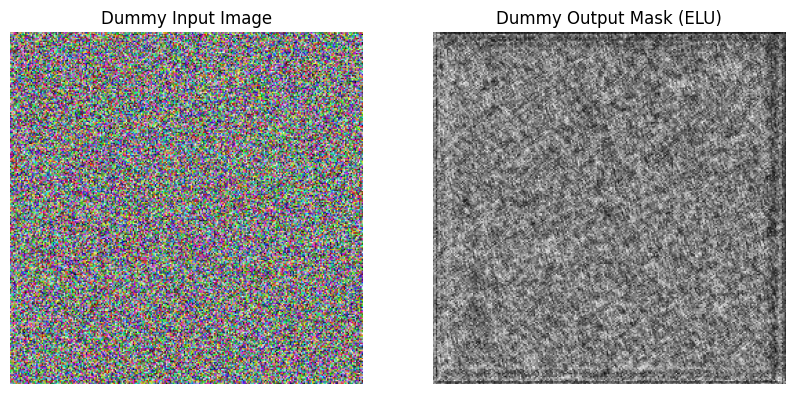

In [9]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model
import numpy as np
import matplotlib.pyplot as plt

def unet_model_elu(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    # Encoder path with 'elu' activation
    conv1 = Conv2D(64, 3, activation='elu', padding='same', kernel_initializer='he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation='elu', padding='same', kernel_initializer='he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='elu', padding='same', kernel_initializer='he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation='elu', padding='same', kernel_initializer='he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    # Bottleneck
    conv3 = Conv2D(256, 3, activation='elu', padding='same', kernel_initializer='he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation='elu', padding='same', kernel_initializer='he_normal')(conv3)

    # Decoder path
    up4 = Conv2D(128, 2, activation='elu', padding='same', kernel_initializer='he_normal')(UpSampling2D(size=(2, 2))(conv3))
    merge4 = concatenate([conv2, up4], axis=3)
    conv4 = Conv2D(128, 3, activation='elu', padding='same', kernel_initializer='he_normal')(merge4)
    conv4 = Conv2D(128, 3, activation='elu', padding='same', kernel_initializer='he_normal')(conv4)

    up5 = Conv2D(64, 2, activation='elu', padding='same', kernel_initializer='he_normal')(UpSampling2D(size=(2, 2))(conv4))
    merge5 = concatenate([conv1, up5], axis=3)
    conv5 = Conv2D(64, 3, activation='elu', padding='same', kernel_initializer='he_normal')(merge5)
    conv5 = Conv2D(64, 3, activation='elu', padding='same', kernel_initializer='he_normal')(conv5)

    conv6 = Conv2D(1, 1, activation='sigmoid')(conv5) # Output a single channel for binary segmentation

    model = Model(inputs=inputs, outputs=conv6)

    return model

# Create and summarize the U-Net model with ELU activations
unet_elu = unet_model_elu()
unet_elu.summary()

# Demonstrate with a dummy input
dummy_output_mask_elu = unet_elu.predict(dummy_input_image)

print(f"\nDummy input shape: {dummy_input_image.shape}")
print(f"Dummy output mask shape: {dummy_output_mask_elu.shape}")

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Dummy Input Image")
plt.imshow(dummy_input_image[0])
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Dummy Output Mask (ELU)")
plt.imshow(dummy_output_mask_elu[0, :, :, 0], cmap='gray')
plt.axis('off')
plt.show()

#### Solution to U-Net Exercise 3: Multi-class Segmentation

In [10]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model

def unet_model_multiclass(input_size=(256, 256, 3), num_classes=5):
    inputs = Input(input_size)

    # Encoder path (same as original)
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    # Bottleneck (same as original)
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)

    # Decoder path (same as original)
    up4 = Conv2D(128, 2, activation='relu', padding='same', kernel_initializer='he_normal')(UpSampling2D(size=(2, 2))(conv3))
    merge4 = concatenate([conv2, up4], axis=3)
    conv4 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge4)
    conv4 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)

    up5 = Conv2D(64, 2, activation='relu', padding='same', kernel_initializer='he_normal')(UpSampling2D(size=(2, 2))(conv4))
    merge5 = concatenate([conv1, up5], axis=3)
    conv5 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge5)
    conv5 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)

    # Output layer for multi-class segmentation
    conv6 = Conv2D(num_classes, 1, activation='softmax')(conv5) # num_classes filters and softmax activation

    model = Model(inputs=inputs, outputs=conv6)

    return model

# Create and summarize the U-Net model for 5 classes
unet_multiclass = unet_model_multiclass(num_classes=5)
unet_multiclass.summary()

# Demonstrate with a dummy input
dummy_output_mask_multiclass = unet_multiclass.predict(dummy_input_image)

print(f"\nDummy input shape: {dummy_input_image.shape}")
print(f"Dummy output mask shape (5 classes): {dummy_output_mask_multiclass.shape}")
print(f"Example prediction for first pixel (probabilities across 5 classes): {dummy_output_mask_multiclass[0, 0, 0]}")

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_44 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_4[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_45 (Conv2D)  │ (None, 256, 256,  │     36,928 │ conv2d_44[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_7     │ (None, 128, 128,  │          0 │ conv2d_45[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_46 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_7[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_47 (Conv2D)  │ (None, 128, 128,  │    147,584 │ conv2d_46[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 64, 64,    │          0 │ conv2d_47[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_48 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_8[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_49 (Conv2D)  │ (None, 64, 64,    │    590,080 │ conv2d_48[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_7     │ (None, 128, 128,  │          0 │ conv2d_49[0][0]   │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_50 (Conv2D)  │ (None, 128, 128,  │    131,200 │ up_sampling2d_7[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 128, 128,  │          0 │ conv2d_47[0][0],  │
│ (Concatenate)       │ 256)              │            │ conv2d_50[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_51 (Conv2D)  │ (None, 128, 128,  │    295,040 │ concatenate_7[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_52 (Conv2D)  │ (None, 128, 128,  │    147,584 │ conv2d_51[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_8     │ (None, 256, 256,  │          0 │ conv2d_52[0][0]   │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_53 (Conv2D)  │ (None, 256, 256,  │     32,832 │ up_sampling2d_8[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_8       │ (None, 256, 256,  │          0 │ conv2d_45[0][0],

 Total params: 1,863,109 (7.11 MB)

 Trainable params: 1,863,109 (7.11 MB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step

Dummy input shape: (1, 256, 256, 3)
Dummy output mask shape (5 classes): (1, 256, 256, 5)
Example prediction for first pixel (probabilities across 5 classes): [    0.17145     0.25225     0.22893     0.10131     0.24606]


### 3D CNN Volumetric Data Processing Exercises

1.  **Modify 3D CNN Architecture:** In the `cnn3d_model` function in cell (`2656031a`):
    *   Adjust the `kernel_size` of the `Conv3D` layers (e.g., from `(3, 3, 3)` to `(5, 5, 5)`).

        ```python
        # Example: Changing kernel size
        # conv1 = Conv3D(32, kernel_size=(5, 5, 5), activation='relu', padding='same')(inputs)
        ```

    *   Change the `pool_size` of the `MaxPooling3D` layers.

        ```python
        # Example: Changing pool size
        # pool1 = MaxPooling3D(pool_size=(3, 3, 3))(conv1)
        ```

    *   Add another `Conv3D` and `MaxPooling3D` block to make the network deeper. What effect do these changes have on the model's complexity and output shape?

2.  **Change Output Classes:** The current 3D CNN is set up for 2 classes (`num_classes=2`). Change `num_classes` to `5` and observe how the `Dense` layer and `dummy_3d_output` shape adapt. What kind of problem would this model be solving then?

    ```python
    # Example: Changing number of output classes
    # def cnn3d_model(input_shape=(32, 32, 32, 1), num_classes=5):
    #     # ... (rest of the model definition)
    #     outputs = Dense(num_classes, activation='softmax')(dense1)
    ```

3.  **Challenge: Visualize Different Slices:** The example visualizes the middle slice (`16`). Modify the code to visualize the first slice (`0`) or a different slice (e.g., `8` or `24`) of the `dummy_3d_input`. How would you visualize this 3D data in a more comprehensive way (e.g., a series of slices or a 3D rendering)?

    ```python
    # Example: Visualizing a different slice
    # plt.imshow(dummy_3d_input[0, :, :, 0, 0], cmap='gray') # First slice
    # plt.imshow(dummy_3d_input[0, :, :, 24, 0], cmap='gray') # 24th slice
    ```

#### Solution to 3D CNN Exercise 1: Modify 3D CNN Architecture

In [11]:
from tensorflow.keras.layers import Input, Conv3D, MaxPooling3D, Flatten, Dense
from tensorflow.keras.models import Model

def cnn3d_model_modified(input_shape=(32, 32, 32, 1), num_classes=2):
    inputs = Input(input_shape)

    conv1 = Conv3D(32, kernel_size=(5, 5, 5), activation='relu', padding='same')(inputs) # Changed kernel_size
    pool1 = MaxPooling3D(pool_size=(3, 3, 3))(conv1) # Changed pool_size

    conv2 = Conv3D(64, kernel_size=(3, 3, 3), activation='relu', padding='same')(pool1)
    pool2 = MaxPooling3D(pool_size=(2, 2, 2))(conv2)

    # Add another Conv3D and MaxPooling3D block
    conv3 = Conv3D(128, kernel_size=(3, 3, 3), activation='relu', padding='same')(pool2)
    pool3 = MaxPooling3D(pool_size=(2, 2, 2))(conv3)

    flatten = Flatten()(pool3) # Connect to the new pool layer
    dense1 = Dense(128, activation='relu')(flatten)
    outputs = Dense(num_classes, activation='softmax')(dense1)

    model = Model(inputs=inputs, outputs=outputs)
    return model

# Create and summarize the modified 3D CNN model
cnn3d_mod = cnn3d_model_modified()
cnn3d_mod.summary()

# Demonstrate with a dummy 3D input
dummy_3d_input_mod = np.random.rand(1, 32, 32, 32, 1).astype(np.float32)
dummy_3d_output_mod = cnn3d_mod.predict(dummy_3d_input_mod)

print(f"\nDummy 3D input shape: {dummy_3d_input_mod.shape}")
print(f"Dummy 3D output (probabilities for {cnn3d_mod.output_shape[1]} classes): {dummy_3d_output_mod.shape}")

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 32, 32, 32, 1)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_2 (Conv3D)               │ (None, 32, 32, 32, 32) │         4,032 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_2 (MaxPooling3D)  │ (None, 10, 10, 10, 32) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_3 (Conv3D)               │ (None, 10, 10, 10, 64) │        55,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_3 (MaxPooling3D)  │ (None, 5, 5, 5, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_4 (Conv3D)               │ (None, 5, 5, 5, 128)   │       221,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_4 (MaxPooling3D)  │ (None, 2, 2, 2, 128)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 412,162 (1.57 MB)

 Trainable params: 412,162 (1.57 MB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step

Dummy 3D input shape: (1, 32, 32, 32, 1)
Dummy 3D output (probabilities for 2 classes): (1, 2)


#### Solution to 3D CNN Exercise 2: Change Output Classes

In [12]:
from tensorflow.keras.layers import Input, Conv3D, MaxPooling3D, Flatten, Dense
from tensorflow.keras.models import Model

def cnn3d_model_multiclass(input_shape=(32, 32, 32, 1), num_classes=5):
    inputs = Input(input_shape)

    conv1 = Conv3D(32, kernel_size=(3, 3, 3), activation='relu', padding='same')(inputs)
    pool1 = MaxPooling3D(pool_size=(2, 2, 2))(conv1)

    conv2 = Conv3D(64, kernel_size=(3, 3, 3), activation='relu', padding='same')(pool1)
    pool2 = MaxPooling3D(pool_size=(2, 2, 2))(conv2)

    flatten = Flatten()(pool2)
    dense1 = Dense(128, activation='relu')(flatten)
    outputs = Dense(num_classes, activation='softmax')(dense1) # num_classes changed to 5

    model = Model(inputs=inputs, outputs=outputs)
    return model

# Create and summarize the 3D CNN model for 5 classes
cnn3d_multiclass = cnn3d_model_multiclass(num_classes=5)
cnn3d_multiclass.summary()

# Demonstrate with a dummy 3D input
dummy_3d_input_mc = np.random.rand(1, 32, 32, 32, 1).astype(np.float32)
dummy_3d_output_mc = cnn3d_multiclass.predict(dummy_3d_input_mc)

print(f"\nDummy 3D input shape: {dummy_3d_input_mc.shape}")
print(f"Dummy 3D output (probabilities for {cnn3d_multiclass.output_shape[1]} classes): {dummy_3d_output_mc.shape}")
print(f"Example prediction: {dummy_3d_output_mc[0]}")

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 32, 32, 32, 1)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_5 (Conv3D)               │ (None, 32, 32, 32, 32) │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_5 (MaxPooling3D)  │ (None, 16, 16, 16, 32) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3d_6 (Conv3D)               │ (None, 16, 16, 16, 64) │        55,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_6 (MaxPooling3D)  │ (None, 8, 8, 8, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │     4,194,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,251,333 (16.22 MB)

 Trainable params: 4,251,333 (16.22 MB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step

Dummy 3D input shape: (1, 32, 32, 32, 1)
Dummy 3D output (probabilities for 5 classes): (1, 5)
Example prediction: [    0.19848     0.18525     0.15315     0.24015     0.22298]


#### Solution to 3D CNN Exercise 3: Visualize Different Slices

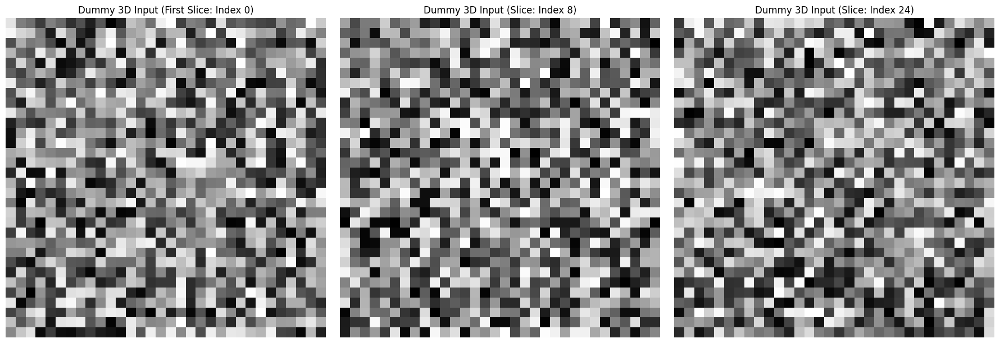

In [13]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming dummy_3d_input from the original example is available
# If not, generate it:
# dummy_3d_input = np.random.rand(1, 32, 32, 32, 1).astype(np.float32)

plt.figure(figsize=(18, 6))

# Visualize the first slice (index 0)
plt.subplot(1, 3, 1)
plt.title("Dummy 3D Input (First Slice: Index 0)")
plt.imshow(dummy_3d_input[0, :, :, 0, 0], cmap='gray')
plt.axis('off')

# Visualize the 8th slice (index 8)
plt.subplot(1, 3, 2)
plt.title("Dummy 3D Input (Slice: Index 8)")
plt.imshow(dummy_3d_input[0, :, :, 8, 0], cmap='gray')
plt.axis('off')

# Visualize the 24th slice (index 24)
plt.subplot(1, 3, 3)
plt.title("Dummy 3D Input (Slice: Index 24)")
plt.imshow(dummy_3d_input[0, :, :, 24, 0], cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_57 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_7[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_58 (Conv2D)  │ (None, 256, 256,  │     36,928 │ conv2d_57[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 128, 128,  │          0 │ conv2d_58[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_59 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_9[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_60 (Conv2D)  │ (None, 128, 128,  │    147,584 │ conv2d_59[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_10    │ (None, 64, 64,    │          0 │ conv2d_60[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_61 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_10… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_62 (Conv2D)  │ (None, 64, 64,    │    590,080 │ conv2d_61[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_9     │ (None, 128, 128,  │          0 │ conv2d_62[0][0]   │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_63 (Conv2D)  │ (None, 128, 128,  │    131,200 │ up_sampling2d_9[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_9       │ (None, 128, 128,  │          0 │ conv2d_60[0][0],  │
│ (Concatenate)       │ 256)              │            │ conv2d_63[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_64 (Conv2D)  │ (None, 128, 128,  │    295,040 │ concatenate_9[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_65 (Conv2D)  │ (None, 128, 128,  │    147,584 │ conv2d_64[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_10    │ (None, 256, 256,  │          0 │ conv2d_65[0][0]   │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_66 (Conv2D)  │ (None, 256, 256,  │     32,832 │ up_sampling2d_10… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_10      │ (None, 256, 256,  │          0 │ conv2d_58[0][0],

 Total params: 1,862,849 (7.11 MB)

 Trainable params: 1,862,849 (7.11 MB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step

Dummy input shape: (1, 256, 256, 3)
Dummy output mask shape: (1, 256, 256, 1)


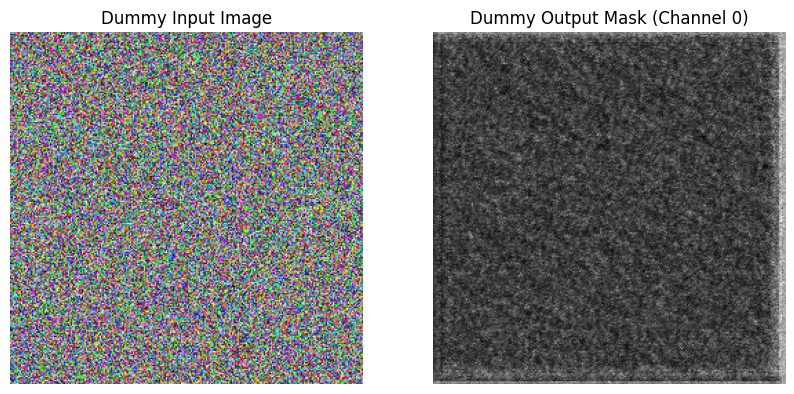

In [14]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model
import numpy as np
import matplotlib.pyplot as plt

def unet_model(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    # Encoder path
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    # Bottleneck
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)

    # Decoder path
    up4 = Conv2D(128, 2, activation='relu', padding='same', kernel_initializer='he_normal')(UpSampling2D(size=(2, 2))(conv3))
    merge4 = concatenate([conv2, up4], axis=3)
    conv4 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge4)
    conv4 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)

    up5 = Conv2D(64, 2, activation='relu', padding='same', kernel_initializer='he_normal')(UpSampling2D(size=(2, 2))(conv4))
    merge5 = concatenate([conv1, up5], axis=3)
    conv5 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge5)
    conv5 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)

    conv6 = Conv2D(1, 1, activation='sigmoid')(conv5) # Output a single channel for binary segmentation

    model = Model(inputs=inputs, outputs=conv6)

    return model

# Create and summarize the U-Net model
unet = unet_model()
unet.summary()

# Demonstrate with a dummy input
dummy_input_image = np.random.rand(1, 256, 256, 3).astype(np.float32)
dummy_output_mask = unet.predict(dummy_input_image)

print(f"\nDummy input shape: {dummy_input_image.shape}")
print(f"Dummy output mask shape: {dummy_output_mask.shape}")

# Visualize a dummy input and output (first channel of the mask)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Dummy Input Image")
plt.imshow(dummy_input_image[0])
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Dummy Output Mask (Channel 0)")
plt.imshow(dummy_output_mask[0, :, :, 0], cmap='gray')
plt.axis('off')
plt.show()